# **TRAIN RESNET50**

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import fastai
import torch
import platform
from fastai.vision import *
from fastai.metrics import error_rate

In [3]:
fastai.__version__

'1.0.60'

In [4]:
torch.__version__

'1.4.0'

In [5]:
platform.sys.version

'3.6.8 |Anaconda, Inc.| (default, Dec 30 2018, 01:22:34) \n[GCC 7.3.0]'

In [11]:
inputPath = Path('../../input/lesson1')
inputPath.ls()

[PosixPath('../../input/lesson1/train'),
 PosixPath('../../input/lesson1/.ipynb_checkpoints'),
 PosixPath('../../input/lesson1/test'),
 PosixPath('../../input/lesson1/valid')]

In [12]:
outputPath = Path('../../output/lesson1')
outputPath.ls()

[]

In [13]:
tfms = get_transforms(do_flip=False)
size = 224
bs = 16

In [14]:
data = ImageDataBunch.from_folder(inputPath, test='test', ds_tfms=tfms, size=size, bs=bs).normalize(imagenet_stats)

In [15]:
data

ImageDataBunch;

Train: LabelList (278 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
outdoor_bouldering,outdoor_bouldering,outdoor_bouldering,outdoor_bouldering,outdoor_bouldering
Path: ../../input/lesson1;

Valid: LabelList (99 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
outdoor_bouldering,outdoor_bouldering,outdoor_bouldering,outdoor_bouldering,outdoor_bouldering
Path: ../../input/lesson1;

Test: LabelList (9 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: EmptyLabelList
,,,,
Path: ../../input/lesson1

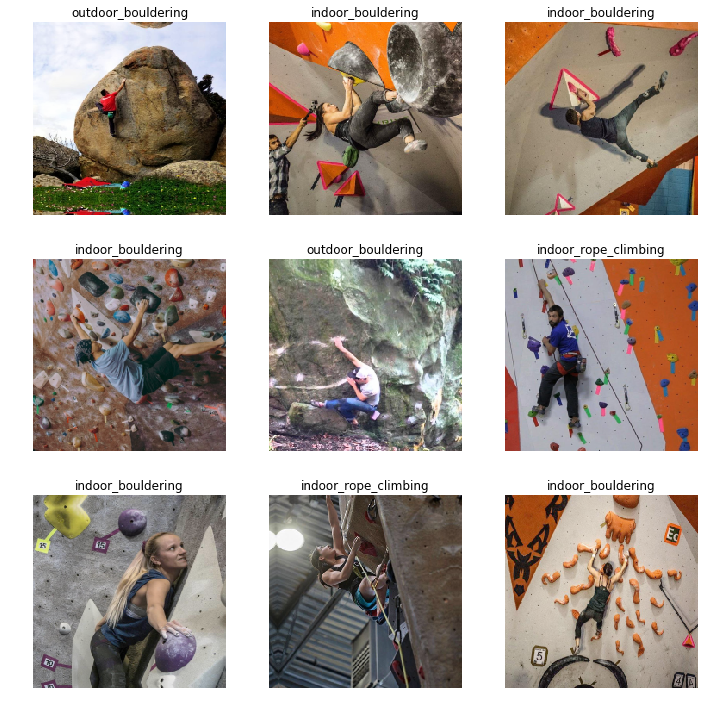

In [16]:
data.show_batch(rows=3, figsize=(10,10), ds_type=DatasetType.Train)

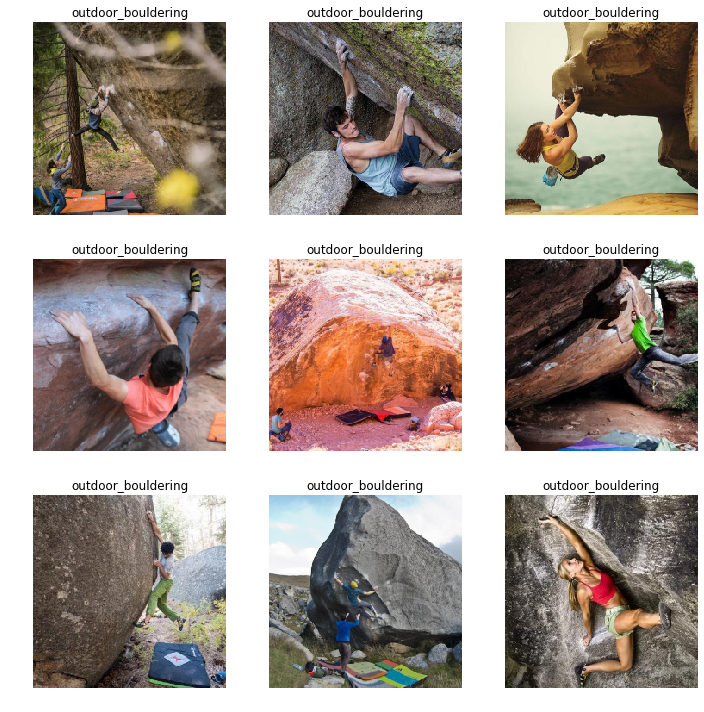

In [17]:
data.show_batch(rows=3, figsize=(10,10), ds_type=DatasetType.Valid)

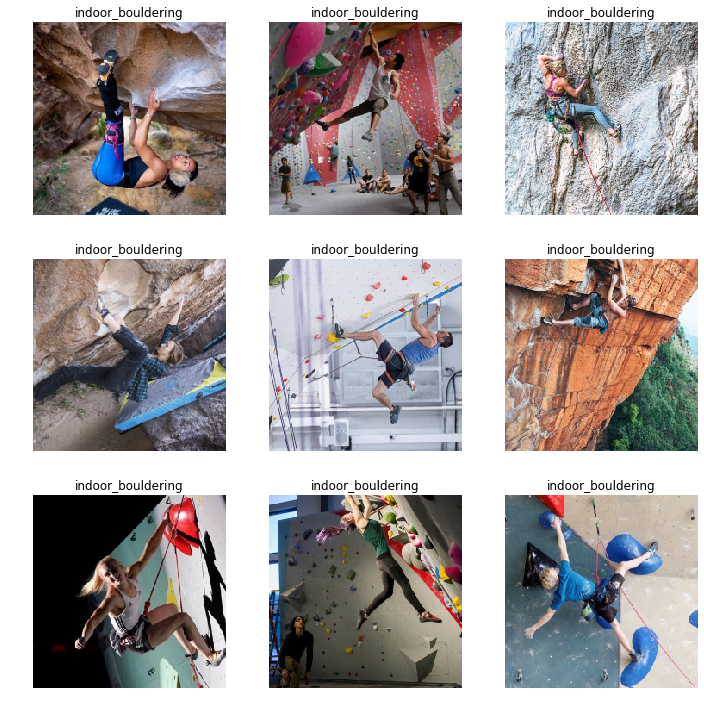

In [18]:
data.show_batch(rows=3, figsize=(10,10), ds_type=DatasetType.Test)

In [19]:
learn = cnn_learner(data, models.resnet50, metrics=error_rate)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /home/onepanel/.cache/torch/checkpoints/resnet50-19c8e357.pth


In [20]:
learn.path = outputPath

In [21]:
learn.fit_one_cycle(5)

epoch,train_loss,valid_loss,error_rate,time
0,1.440729,0.802152,0.272727,00:17
1,1.110702,1.075032,0.212121,00:13
2,0.857157,0.855767,0.181818,00:13
3,0.663188,0.789394,0.222222,00:13
4,0.544032,0.774920,0.191919,00:13


In [22]:
learn.save('climbing-classifier-stage-1', return_path=True)

PosixPath('../../output/lesson1/models/climbing-classifier-stage-1.pth')

In [23]:
interp = ClassificationInterpretation.from_learner(learn)
losses,idxs = interp.top_losses()
len(data.valid_ds)==len(losses)==len(idxs)

True

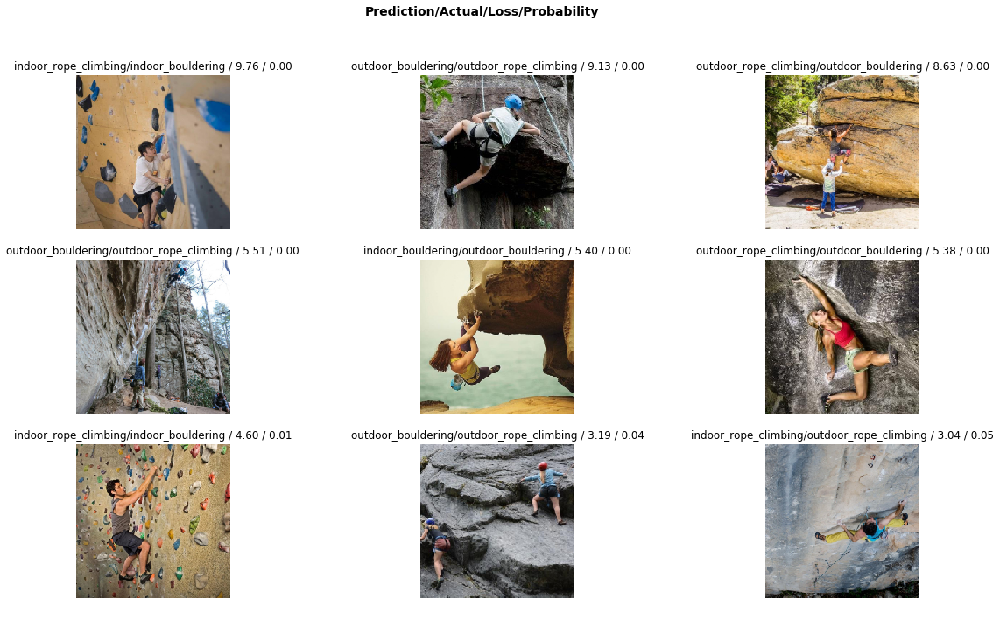

In [24]:
interp.plot_top_losses(9, figsize=(20,11))

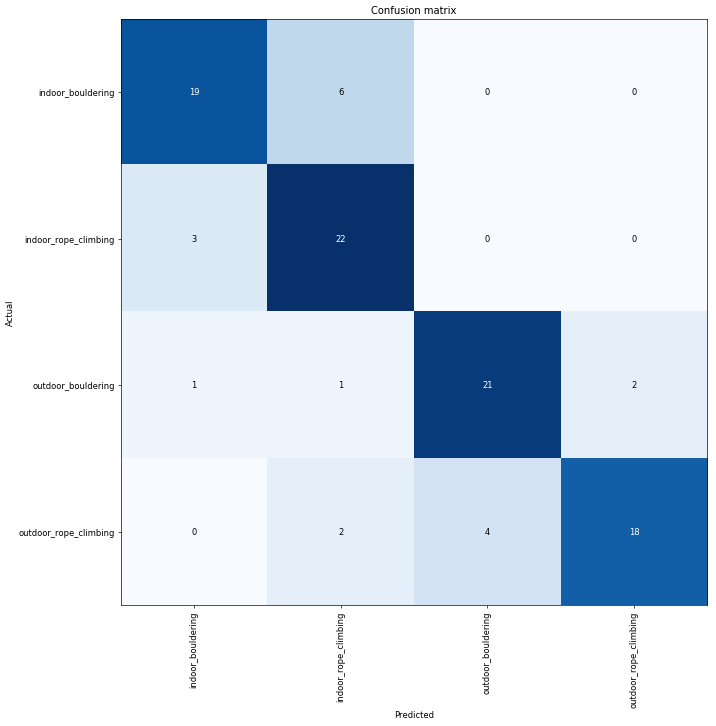

In [25]:
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [26]:
interp.most_confused(min_val=1)

[('indoor_bouldering', 'indoor_rope_climbing', 6),
 ('outdoor_rope_climbing', 'outdoor_bouldering', 4),
 ('indoor_rope_climbing', 'indoor_bouldering', 3),
 ('outdoor_bouldering', 'outdoor_rope_climbing', 2),
 ('outdoor_rope_climbing', 'indoor_rope_climbing', 2),
 ('outdoor_bouldering', 'indoor_bouldering', 1),
 ('outdoor_bouldering', 'indoor_rope_climbing', 1)]

In [27]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


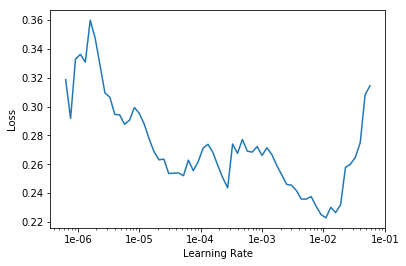

In [28]:
learn.recorder.plot()

In [29]:
learn.unfreeze()
learn.fit_one_cycle(5, max_lr=slice(1e-5,1e-2))

epoch,train_loss,valid_loss,error_rate,time
0,0.368291,1.960949,0.232323,00:14
1,0.700787,0.786045,0.151515,00:14
2,0.732972,2.324733,0.303030,00:14
3,0.634380,0.599070,0.171717,00:14
4,0.467080,0.579056,0.141414,00:14


In [30]:
interp = ClassificationInterpretation.from_learner(learn)
losses,idxs = interp.top_losses()
len(data.valid_ds)==len(losses)==len(idxs)

True

In [31]:
learn.save('climbing-classifier-stage-2', return_path=True)

PosixPath('../../output/lesson1/models/climbing-classifier-stage-2.pth')

In [32]:
learn.fit_one_cycle(5, max_lr=slice(1e-5,1e-2))

epoch,train_loss,valid_loss,error_rate,time
0,0.321460,0.331845,0.141414,00:14
1,0.324293,0.788780,0.141414,00:14
2,0.470533,0.504817,0.121212,00:14
3,0.487498,0.583008,0.111111,00:14
4,0.391195,0.294424,0.111111,00:14


In [33]:
interp = ClassificationInterpretation.from_learner(learn)
losses,idxs = interp.top_losses()
len(data.valid_ds)==len(losses)==len(idxs)

True

In [34]:
learn.save('climbing-classifier-stage-3', return_path=True)

PosixPath('../../output/lesson1/models/climbing-classifier-stage-3.pth')

# **PREDICT**

In [39]:
testPath = Path('../../input/lesson1/test')
testPath.ls()

[PosixPath('../../input/lesson1/test/out_bould_1.jpg'),
 PosixPath('../../input/lesson1/test/ind_bould_1.jpg'),
 PosixPath('../../input/lesson1/test/out_rope_climb_1.jpg'),
 PosixPath('../../input/lesson1/test/out_bould_2.jpg'),
 PosixPath('../../input/lesson1/test/ind_rope_climb_2.jpg'),
 PosixPath('../../input/lesson1/test/out_rope_climb_2.jpg'),
 PosixPath('../../input/lesson1/test/ind_rope_climb_1.jpg'),
 PosixPath('../../input/lesson1/test/ind_bould_2.jpg'),
 PosixPath('../../input/lesson1/test/ind_rope_climb_3.jpg')]

In [40]:
testData = ImageList.from_folder(testPath)

In [45]:
testData.items[0]

PosixPath('../../input/lesson1/test/out_bould_1.jpg')

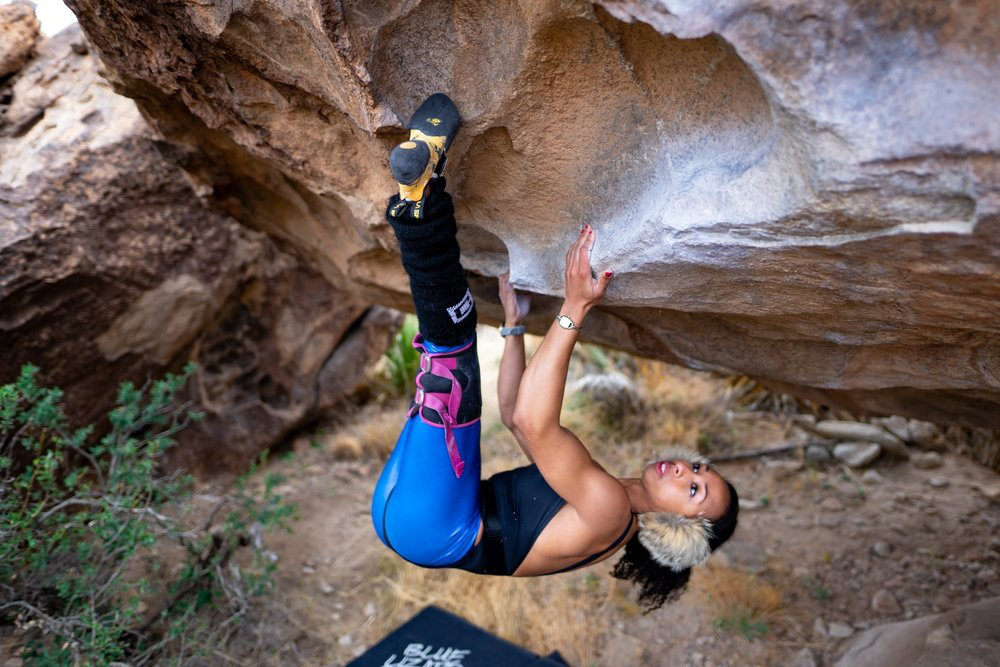

In [41]:
testData[0]

In [47]:
learn.predict(testData[0])

(Category outdoor_bouldering,
 tensor(2),
 tensor([6.6412e-08, 1.3783e-10, 1.0000e+00, 3.1068e-08]))

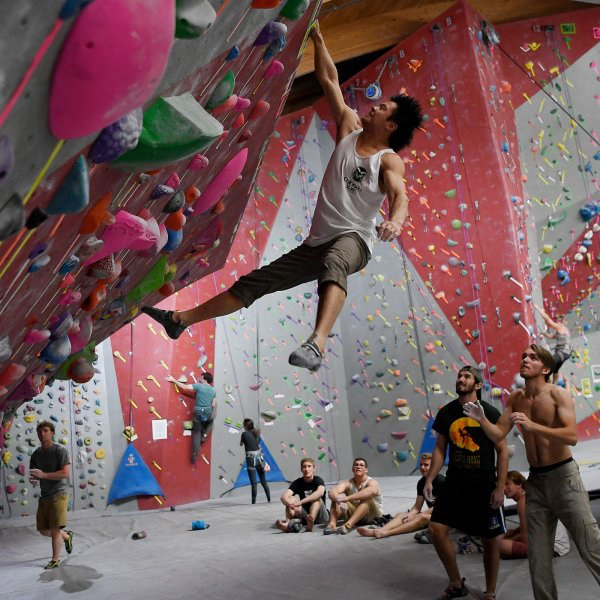

In [49]:
testData[1]

In [50]:
learn.predict(testData[1])

(Category indoor_bouldering,
 tensor(0),
 tensor([9.4221e-01, 5.7358e-02, 9.8415e-07, 4.2674e-04]))

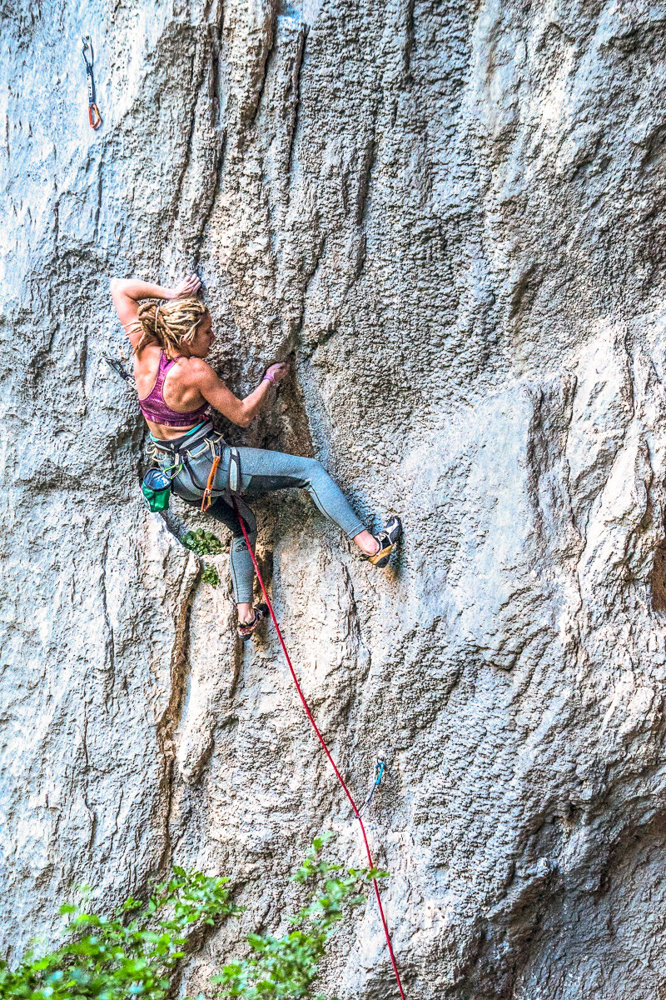

In [51]:
testData[2]

In [52]:
learn.predict(testData[2])

(Category outdoor_rope_climbing,
 tensor(3),
 tensor([1.6708e-08, 8.7990e-07, 1.5879e-06, 1.0000e+00]))

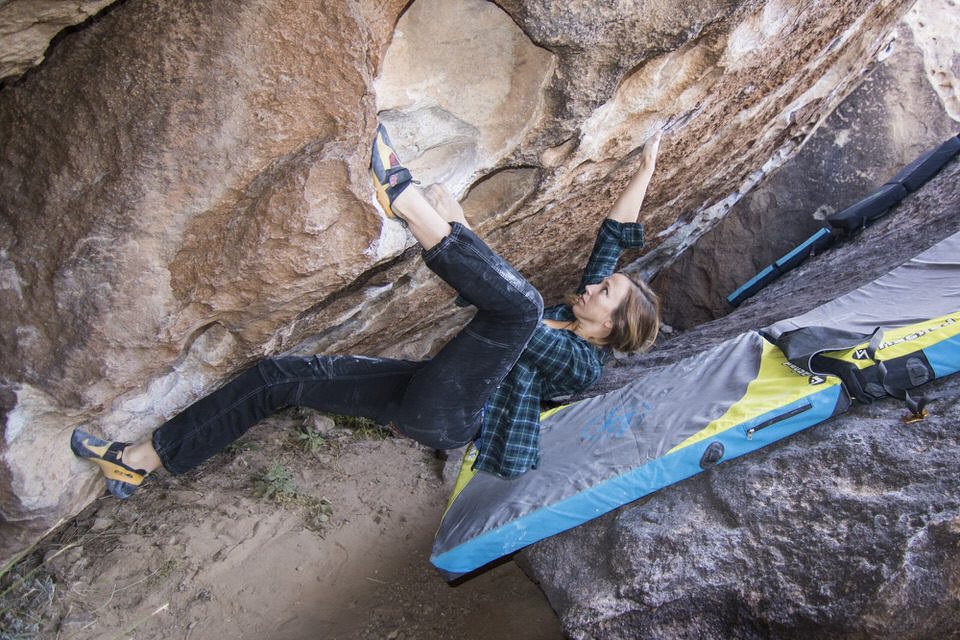

In [53]:
testData[3]

In [54]:
learn.predict(testData[3])

(Category outdoor_rope_climbing,
 tensor(3),
 tensor([5.6106e-07, 1.2652e-07, 7.2173e-03, 9.9278e-01]))

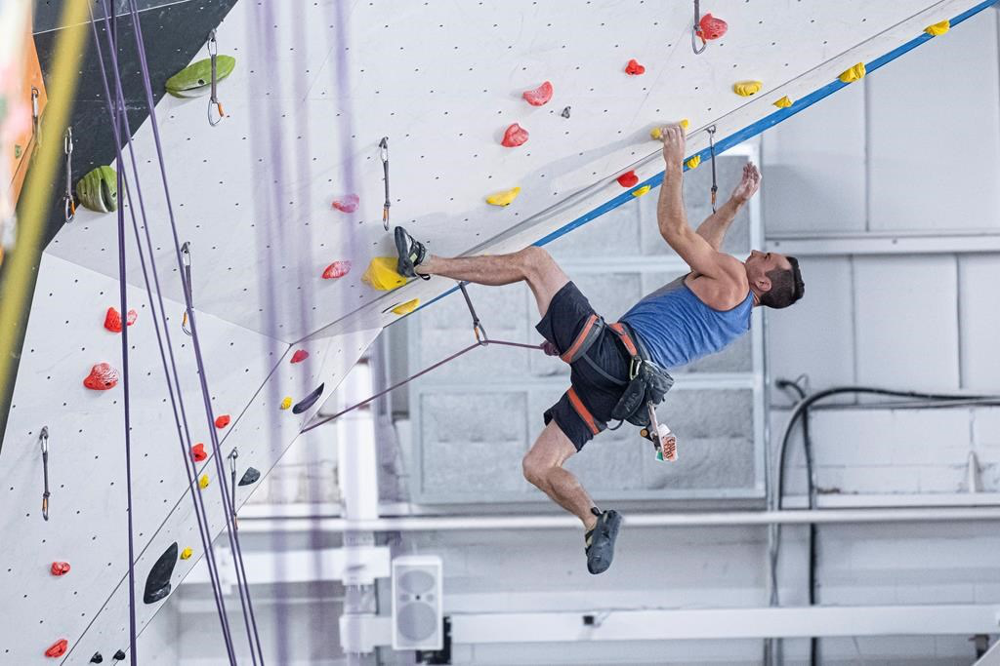

In [55]:
testData[4]

In [56]:
learn.predict(testData[4])

(Category indoor_rope_climbing,
 tensor(1),
 tensor([1.2935e-08, 1.0000e+00, 1.3879e-12, 1.8977e-08]))

In [ ]:
testData[5]

In [ ]:
testData[6]

In [ ]:
testData[7]

In [ ]:
testData[8]